<a href="https://colab.research.google.com/github/SATYAPRAVEENKUMAR2456/SATYAPRAVEENKUMAR2456/blob/main/Crypto_prediction_using_machine_learning_on_Bitcoin_USD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install yfinance

     |████████████████████████████████| 6.3 MB 8.8 MB/s 
  Attempting uninstall: lxml
    Found existing installation: lxml 4.2.6
    Uninstalling lxml-4.2.6:
      Successfully uninstalled lxml-4.2.6


In [ ]:
import yfinance as yf
import numpy as np

In [ ]:
df=yf.download('BTC-USD',start='2018-01-01')

[*********************100%***********************]  1 of 1 completed


In [ ]:
df.head()


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2018-01-01,14112.200195,14112.200195,13154.700195,13657.200195,13657.200195,10291200000
2018-01-02,13625.000000,15444.599609,13163.599609,14982.099609,14982.099609,16846600192
2018-01-03,14978.200195,15572.799805,14844.500000,15201.000000,15201.000000,16871900160
2018-01-04,15270.700195,15739.700195,14522.200195,15599.200195,15599.200195,21783199744
2018-01-05,15477.200195,17705.199219,15202.799805,17429.500000,17429.500000,23840899072


In [ ]:
df['returns']=np.log(df.Close.pct_change()+1)

In [ ]:
def lagit(df,lags):
    names=[]
    for i in range(1,lags+1):
        df['Lag_'+str(i)]=df['returns'].shift(i)
        names.append('Lag_'+str(i))
    return names

In [ ]:
lagnames=lagit(df,5)

In [ ]:
df.dropna(inplace=True)

LINEAR REGRESSION

In [ ]:
from sklearn.linear_model import LinearRegression
model=LinearRegression()
model.fit(df[lagnames],df['returns'])

LinearRegression()

In [ ]:
df['prediction_LR']=model.predict(df[lagnames])
df['direction_LR']=[1 if i>0 else -1 for i in df['prediction_LR']]
df['strat_LR']=df['direction_LR']*df['returns']
np.exp(df[['returns','strat_LR']].sum())

returns      3.374344
strat_LR    19.009550
dtype: float64

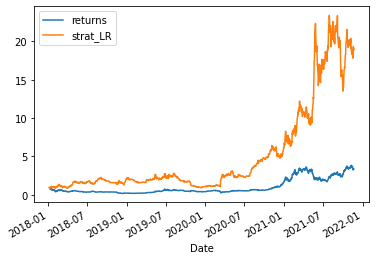

In [ ]:
np.exp(df[['returns','strat_LR']].cumsum()).plot()

In [ ]:
from sklearn.model_selection import train_test_split
train,test=train_test_split(df,shuffle=False,test_size=0.3,random_state=0)

In [ ]:
train=train.copy()
test=test.copy()
model=LinearRegression()
model.fit(train[lagnames],train['returns'])
test['prediction_LR']=model.predict(test[lagnames])
test['direction_LR']=[1 if i>0 else -1 for i in test.prediction_LR]
test['strat_LR']=test['direction_LR']*test['returns']
np.exp(test[['returns','strat_LR']].sum())

returns     5.406899
strat_LR    1.420981
dtype: float64

In [ ]:
(test['direction_LR'].diff()!=0).value_counts()

True     270
False    154
Name: direction_LR, dtype: int64

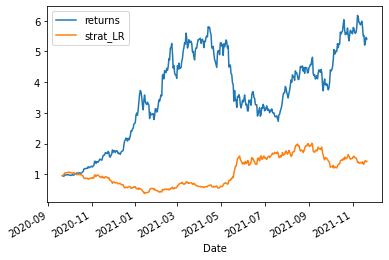

In [ ]:
np.exp(test[['returns','strat_LR']].cumsum()).plot()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import matplotlib

In [ ]:
m = pd.read_csv("/content/sample_data/BTC-USD.csv.zip", names = ['Time','Low','High','Open','Close','Volume'])

m.head()

,Time,Low,High,Open,Close,Volume
0,1528968660,6489.549805,6489.560059,6489.560059,6489.549805,0.587100
1,1528968720,6487.370117,6489.560059,6489.549805,6487.379883,7.706374
2,1528968780,6479.410156,6487.370117,6487.370117,6479.410156,3.088252
3,1528968840,6479.410156,6479.419922,6479.419922,6479.410156,1.404100
4,1528968900,6475.930176,6479.979980,6479.410156,6479.979980,0.753000


In [ ]:
nr = m[m['Time'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = m[m['Time'] == 'canc '].index
m.drop(nr, inplace=True)
nr = m[m['Time'] == 'aban '].index
m.drop(nr, inplace=True)
print(m.shape)
m.head()

print("\n\n")

nr = m[m['Low'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = m[m['Low'] == 'canc '].index
m.drop(nr, inplace=True)
nr = m[m['Low'] == 'aban '].index
m.drop(nr, inplace=True)
print(m.shape)
m.head()

print("\n\n")

nr = m[m['High'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = m[m['High'] == 'canc '].index
m.drop(nr, inplace=True)
nr = m[m['High'] == 'aban '].index
m.drop(nr, inplace=True)
print(m.shape)
m.head()

print("\n\n")

nr = m[m['Open'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = m[m['Open'] == 'canc '].index
m.drop(nr, inplace=True)
nr = m[m['Open'] == 'aban '].index
m.drop(nr, inplace=True)
print(m.shape)
m.head()

print("\n\n")

nr = m[m['Close'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = m[m['Close'] == 'canc '].index
m.drop(nr, inplace=True)
nr = m[m['Close'] == 'aban '].index
m.drop(nr, inplace=True)
print(m.shape)
m.head()

print("\n\n")

nr = m[m['Volume'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = m[m['Volume'] == 'canc '].index
m.drop(nr, inplace=True)
nr = m[m['Volume'] == 'aban '].index
m.drop(nr, inplace=True)
print(m.shape)
m.head()

(97724, 6)



(97724, 6)



(97724, 6)



(97724, 6)



(97724, 6)



(97724, 6)


,Time,Low,High,Open,Close,Volume
0,1528968660,6489.549805,6489.560059,6489.560059,6489.549805,0.587100
1,1528968720,6487.370117,6489.560059,6489.549805,6487.379883,7.706374
2,1528968780,6479.410156,6487.370117,6487.370117,6479.410156,3.088252
3,1528968840,6479.410156,6479.419922,6479.419922,6479.410156,1.404100
4,1528968900,6475.930176,6479.979980,6479.410156,6479.979980,0.753000


In [ ]:
Time = m['Time'].unique()
Time
tim = {}
id = 0
for i in Time:
  tim[i] = id
  id = id+1
print(tim)
m['Time'] = m['Time'].map(tim)
m

print("\n\n")

Low = m['Low'].unique()
Low
low = {}
id = 0
for i in Low:
  low[i] = id
  id = id+1
print(low)
m['Low'] = m['Low'].map(low)
m

{1528968660: 0, 1528968720: 1, 1528968780: 2, 1528968840: 3, 1528968900: 4, 1528968960: 5, 1528969020: 6, 1528969080: 7, 1528969140: 8, 1528969200: 9, 1528969260: 10, 1528969320: 11, 1528969380: 12, 1528969440: 13, 1528969500: 14, 1528969560: 15, 1528969620: 16, 1528969680: 17, 1528969740: 18, 1528969800: 19, 1528969860: 20, 1528969920: 21, 1528969980: 22, 1528970040: 23, 1528970100: 24, 1528970160: 25, 1528970220: 26, 1528970280: 27, 1528970340: 28, 1528970400: 29, 1528970460: 30, 1528970520: 31, 1528970580: 32, 1528970640: 33, 1528970700: 34, 1528970760: 35, 1528970820: 36, 1528970880: 37, 1528970940: 38, 1528971000: 39, 1528971060: 40, 1528971120: 41, 1528971180: 42, 1528971240: 43, 1528971300: 44, 1528971360: 45, 1528971420: 46, 1528971480: 47, 1528971540: 48, 1528971600: 49, 1528971660: 50, 1528971720: 51, 1528971780: 52, 1528971840: 53, 1528971900: 54, 1528971960: 55, 1528972020: 56, 1528972080: 57, 1528972140: 58, 1528972200: 59, 1528972260: 60, 1528972320: 61, 1528972380: 62, 1

,Time,Low,High,Open,Close,Volume
0,0,0,6489.560059,6489.560059,6489.549805,0.587100
1,1,1,6489.560059,6489.549805,6487.379883,7.706374
2,2,2,6487.370117,6487.370117,6479.410156,3.088252
3,3,2,6479.419922,6479.419922,6479.410156,1.404100
4,4,3,6479.979980,6479.410156,6479.979980,0.753000
...,...,...,...,...,...,...
97719,97719,3676,6713.140137,6713.000000,6713.140137,0.769891
97720,97720,3755,6715.000000,6715.000000,6714.520020,1.002652
97721,97721,37729,6714.520020,6714.520020,6714.520020,1.021925
97722,97722,18378,6715.000000,6714.520020,6715.000000,3.645508


In [ ]:
print("\n\n")

High = m['High'].unique()
High
hig = {}
id = 0
for i in High:
  hig[i] = id
  id = id+1
print(hig)
m['High'] = m['High'].map(hig)
m

print("\n\n")

Open = m['Open'].unique()
Open
ope = {}
id = 0
for i in Open:
  ope[i] = id
  id = id+1
print(ope)
m['Open'] = m['Open'].map(ope)
m





{6489.560059: 0, 6487.370117: 1, 6479.419922: 2, 6479.97998: 3, 6480.0: 4, 6479.990234000001: 5, 6478.660156: 6, 6479.339844: 7, 6479.350098: 8, 6481.899902: 9, 6485.0: 10, 6484.720215: 11, 6490.0: 12, 6489.939941: 13, 6487.27002: 14, 6492.680176: 15, 6494.990234000001: 16, 6495.0: 17, 6498.180176: 18, 6500.0: 19, 6497.180176: 20, 6499.779785: 21, 6499.77002: 22, 6499.919922: 23, 6499.169922: 24, 6499.0: 25, 6495.879883: 26, 6498.990234000001: 27, 6498.97998: 28, 6496.169922: 29, 6496.160156: 30, 6495.22998: 31, 6494.77002: 32, 6490.189941: 33, 6493.399902: 34, 6493.390136999999: 35, 6487.830078: 36, 6482.160156: 37, 6474.990234000001: 38, 6481.720215: 39, 6475.0: 40, 6484.790039: 41, 6484.799805: 42, 6483.069824: 43, 6481.0: 44, 6483.569824: 45, 6486.830078: 46, 6487.850098: 47, 6488.390136999999: 48, 6488.399902: 49, 6490.100098: 50, 6490.089844: 51, 6501.930176: 52, 6498.140136999999: 53, 6505.0: 54, 6511.310059: 55, 6519.990234000001: 56, 6519.97998: 57, 6518.859863000001: 58, 6

,Time,Low,High,Open,Close,Volume
0,1528968660,6489.549805,0,0,6489.549805,0.587100
1,1528968720,6487.370117,0,1,6487.379883,7.706374
2,1528968780,6479.410156,1,2,6479.410156,3.088252
3,1528968840,6479.410156,2,3,6479.410156,1.404100
4,1528968900,6475.930176,3,4,6479.979980,0.753000
...,...,...,...,...,...,...
97719,1535214960,6712.990234,35840,3791,6713.140137,0.769891
97720,1535215020,6713.339844,2836,3183,6714.520020,1.002652
97721,1535215080,6714.509766,35841,19531,6714.520020,1.021925
97722,1535215140,6714.520020,2836,19531,6715.000000,3.645508


In [ ]:
print("\n\n")

Close = m['Close'].unique()
Close
clo = {}
id = 0
for i in Close:
  clo[i] = id
  id = id+1
print(clo)
m['Close'] = m['Close'].map(clo)
m

print("\n\n")

Volume = m['Volume'].unique()
Volume
vol = {}
id = 0
for i in Volume:
  vol[i] = id
  id = id+1
print(vol)
m['Volume'] = m['Volume'].map(vol)
m




{6489.549805: 0, 6487.379883: 1, 6479.410156: 2, 6479.97998: 3, 6480.0: 4, 6477.220215: 5, 6479.990234000001: 6, 6478.660156: 7, 6479.339844: 8, 6479.350098: 9, 6481.890136999999: 10, 6484.709961: 11, 6485.0: 12, 6489.990234000001: 13, 6486.359863000001: 14, 6487.259765999999: 15, 6487.27002: 16, 6490.0: 17, 6492.680176: 18, 6494.990234000001: 19, 6494.450195: 20, 6494.97998: 21, 6498.180176: 22, 6497.180176: 23, 6495.0: 24, 6496.350098: 25, 6499.77002: 26, 6499.919922: 27, 6497.790039: 28, 6495.879883: 29, 6498.990234000001: 30, 6496.169922: 31, 6495.22998: 32, 6494.77002: 33, 6490.700195: 34, 6484.990234000001: 35, 6493.399902: 36, 6487.830078: 37, 6483.290039: 38, 6474.169922: 39, 6474.990234000001: 40, 6475.0: 41, 6484.790039: 42, 6484.799805: 43, 6484.22998: 44, 6481.0: 45, 6483.569824: 46, 6486.819824: 47, 6486.830078: 48, 6487.850098: 49, 6488.390136999999: 50, 6488.399902: 51, 6485.310059: 52, 6490.100098: 53, 6490.089844: 54, 6490.049805: 55, 6490.080078: 56, 6498.149902: 5

,Time,Low,High,Open,Close,Volume
0,1528968660,6489.549805,0,0,0,0
1,1528968720,6487.370117,0,1,1,1
2,1528968780,6479.410156,1,2,2,2
3,1528968840,6479.410156,2,3,2,3
4,1528968900,6475.930176,3,4,3,4
...,...,...,...,...,...,...
97719,1535214960,6712.990234,35840,3791,40971,96206
97720,1535215020,6713.339844,2836,3183,19688,96207
97721,1535215080,6714.509766,35841,19531,19688,96208
97722,1535215140,6714.520020,2836,19531,3379,96209


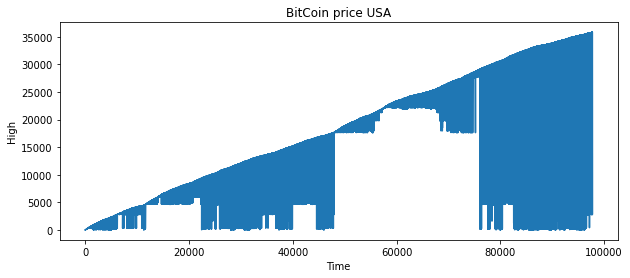

In [ ]:
m.dropna()
plt.figure(figsize=(10,4))
plt.title("BitCoin price USA")
plt.xlabel("Time")
plt.ylabel("High")
plt.plot(m["High"])
plt.show()

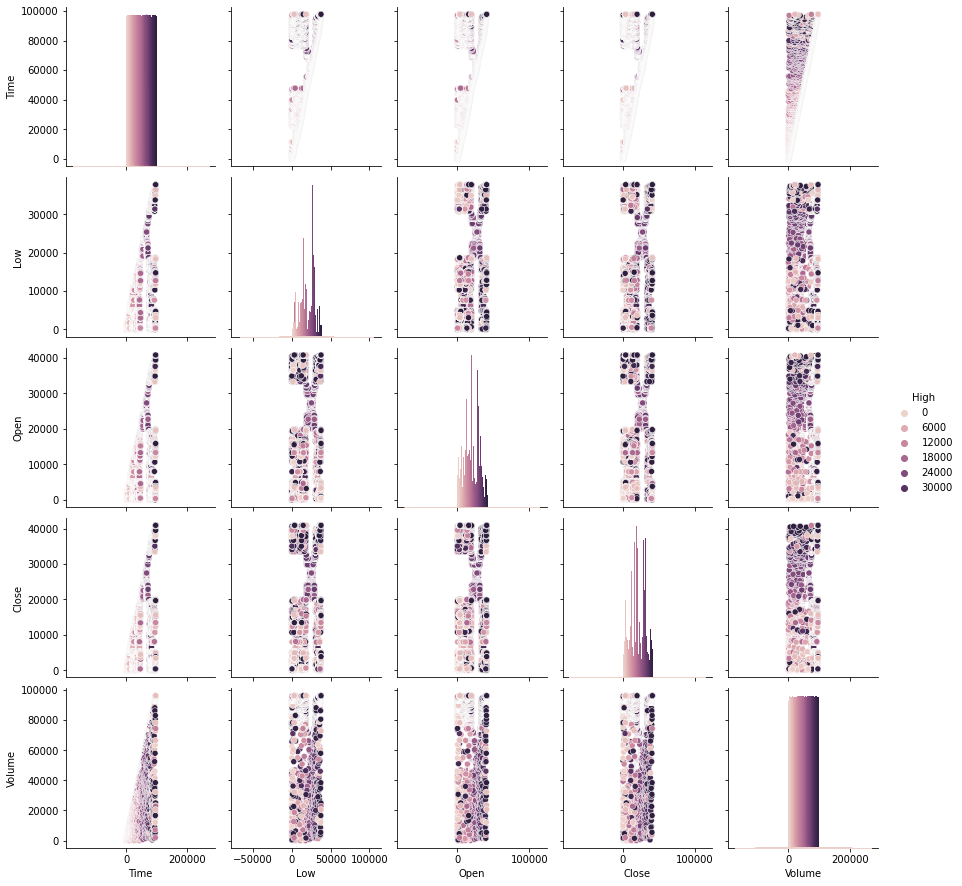

In [ ]:
sns.pairplot(data=m,hue='High')

#Linear_Regression

Features 0: 3022479.132136
Features 1: 45392.725901
Features 2: 4027.491124
Features 3: 47459.265574
Features 4: 45671.076331


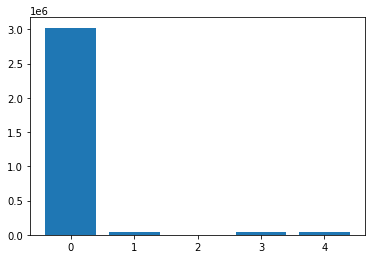

coefficients: 
 [0.01496244 0.00696208 1.78997283 0.01363667 0.01374381]
Variance: 
 0.9827609380546403


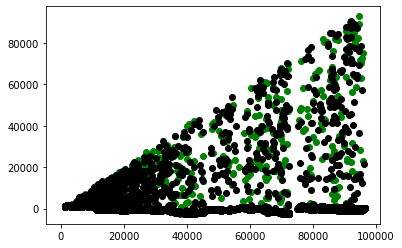

In [ ]:
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import  SelectKBest
from sklearn.feature_selection import f_regression

def Select_features(x_train, y_train, x_test):
  fs = SelectKBest(score_func=f_regression, k ='all')
  fs.fit(x_train, y_train)
  x_train_fs = fs.transform(x_train)
  x_test_fs = fs.transform(x_test)
  return x_train_fs, x_test_fs, fs

m2 = m
m2.head()

y = m2["Volume"]
x = m2[['Time','High','Low','Open','Close']]

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.4,random_state=12)

x_train_fs, x_test_fs, fs = Select_features(x_train, y_train, x_test)

for i in range(len(fs.scores_)):
  print('Features %d: %f' %(i,fs.scores_[i]))


plt.bar([i for i in range(len(fs.scores_))], fs.scores_)
plt.show()

linear_regression = LinearRegression()
linear_regression.fit(x_train,y_train)

print("coefficients: \n",linear_regression.coef_)
print("Variance: \n",linear_regression.score(x_test,y_test))

plt.scatter(linear_regression.predict(x_test),linear_regression.predict(x_test)-y_test, color="green", label="Test data")
plt.scatter(linear_regression.predict(x_train),linear_regression.predict(x_train)-y_train, color="black", label="Train data")

plt.hlines(y=0, xmin=65,xmax=100,linewidth=2)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

poly_reg = PolynomialFeatures(degree=2)
x = poly_reg.fit_transform(x)


x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.4,random_state=10)


linear_regression = LinearRegression()
linear_regression.fit(x_train,y_train)


print("Coefficients: \n",linear_regression.coef_)
print("Variance: \n",linear_regression.score(x_test,y_test))
print("R2: \n",r2_score(y_train, linear_regression.predict(x_train)))

Coefficients: 
 [ 0.00000000e+00  8.10321003e-01  1.51463906e+01  1.50780878e-02
  3.00205495e+00 -4.47569428e+00 -2.59527168e-10 -1.00393270e-08
  7.82156541e-09 -2.16640243e-09  2.73241554e-09  1.40233908e-06
  3.13349005e-05  2.66209151e-07 -6.54674265e-08 -9.64774959e-04
  4.83766594e-05  4.52392639e-05  2.97083441e-07 -6.25056231e-08
 -6.28533043e-08]
Variance: 
 0.9844274194453082
R2: 
 0.9830585735163201


#M_LR

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


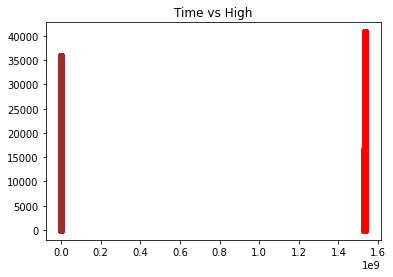

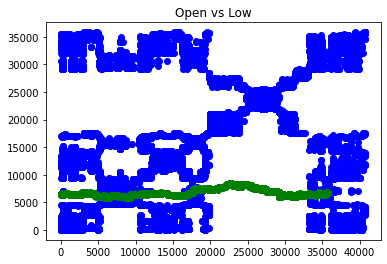

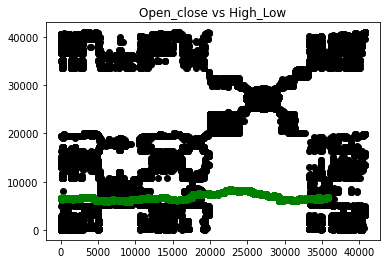

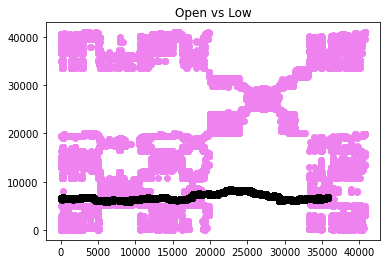

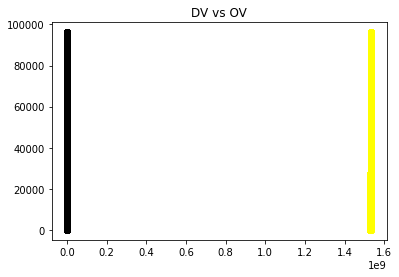

In [ ]:
from sklearn import linear_model
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score

plt.scatter(m["Time"],m["Open"],color="red")
plt.scatter(m["Open"],m["High"],color="brown")
plt.title("Time vs High")
plt.show()

plt.scatter(m["Open"],m["High"],color="blue")
plt.scatter(m["High"],m["Low"],color="green")
plt.title("Open vs Low")
plt.show()

plt.scatter(m["Open"],m["Close"],color="black")
plt.scatter(m["High"],m["Low"],color="green")
plt.title("Open_close vs High_Low")
plt.show()

plt.scatter(m["Open"],m["Close"],color="violet")
plt.scatter(m["High"],m["Low"],color="black")
plt.title("Open vs Low")
plt.show()

plt.scatter(m["Time"],m["Volume"],color="yellow")
plt.scatter(m["Open"],m["Volume"],color="black")
plt.title("DV vs OV")
plt.show()


slope:  [   0.7883543     0.71528821 -128.82806872    0.83939105   64.46488848]

Intrest_get:  152975444864.93155

The Loss:  0.9819546091099646

The given Y values: 
 4904     1529263440
37922    1531250040
79281    1534108680
1284     1529045700
1108     1529035140
            ...    
89578    1534726500
85413    1534476600
44743    1531659300
85099    1534457760
59859    1532566260
Name: Time, Length: 29318, dtype: int64


{'boxes': [<matplotlib.lines.Line2D at 0x7f3a43ded090>],
 'caps': [<matplotlib.lines.Line2D at 0x7f3a43df40d0>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f3a43dfc110>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f3a43df4b90>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7f3a43e3b710>,
  <matplotlib.lines.Line2D at 0x7f3a43dedb50>]}

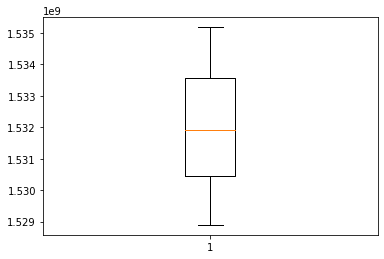

In [ ]:
x=m[["Open","High","Low","Close","Volume"]]
y=m['Time']
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.3,random_state=10)
MLR=linear_model.LinearRegression()
MLR.fit(xtrain,ytrain)
trainpredict=MLR.predict(xtrain)
testpredict=MLR.predict(xtest)
print("\nslope: ",MLR.coef_)
print("\nIntrest_get: ",MLR.intercept_*100)
print("\nThe Loss: ",r2_score(ytest,testpredict))
print("\nThe given Y values: \n",ytest)
plt.boxplot(testpredict)


K_Means

In [ ]:
from sklearn.cluster import KMeans

df = m
df.head()
X=df[['Open','High']]
X=X.to_numpy()

model=KMeans(n_clusters=5)
model.fit(X)
yhat=model.predict(X)
print(yhat)

[0 0 0 ... 1 3 0]


[0 1 2 3 4]


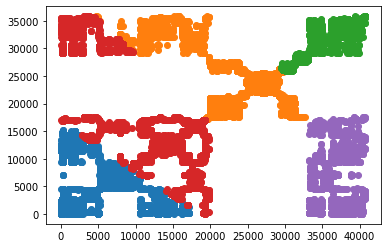

In [ ]:
from numpy import unique,where

clusters=unique(yhat)
print(clusters)

for i in clusters:
  row_id=where(yhat==i)
  plt.scatter(X[row_id,0],X[row_id,1])
plt.show()

#Navie_Bayes

In [ ]:
df2 = pd.read_csv("/content/sample_data/BTC-USD.csv.zip", names = ['Time','Low','High','Open','Close','Volume'])
print(df2.columns)
df2.head()

Index(['Time', 'Low', 'High', 'Open', 'Close', 'Volume'], dtype='object')


,Time,Low,High,Open,Close,Volume
0,1528968660,6489.549805,6489.560059,6489.560059,6489.549805,0.587100
1,1528968720,6487.370117,6489.560059,6489.549805,6487.379883,7.706374
2,1528968780,6479.410156,6487.370117,6487.370117,6479.410156,3.088252
3,1528968840,6479.410156,6479.419922,6479.419922,6479.410156,1.404100
4,1528968900,6475.930176,6479.979980,6479.410156,6479.979980,0.753000


In [ ]:
nr = df2[df2['Time'] == 'n/r'].index
df2.drop(nr, inplace=True)
nr = df2[df2['Time'] == 'canc '].index
df2.drop(nr, inplace=True)
nr = df2[df2['Time'] == 'aban '].index
df2.drop(nr, inplace=True)
print(df2.shape)
df2.head()

print("\n\n")

nr = df2[df2['Low'] == 'n/r'].index
df2.drop(nr, inplace=True)
nr = df2[df2['Low'] == 'canc '].index
df2.drop(nr, inplace=True)
nr = df2[df2['Low'] == 'aban '].index
df2.drop(nr, inplace=True)
print(df2.shape)
df2.head()

print("\n\n")

nr = df2[df2['High'] == 'n/r'].index
df2.drop(nr, inplace=True)
nr = df2[df2['High'] == 'canc '].index
df2.drop(nr, inplace=True)
nr = df2[df2['High'] == 'aban '].index
df2.drop(nr, inplace=True)
print(df2.shape)
df2.head()

print("\n\n")

nr = df2[df2['Open'] == 'n/r'].index
df2.drop(nr, inplace=True)
nr = df2[df2['Open'] == 'canc '].index
df2.drop(nr, inplace=True)
nr = df2[df2['Open'] == 'aban '].index
df2.drop(nr, inplace=True)
print(df2.shape)
df2.head()

print("\n\n")

nr = df2[df2['Close'] == 'n/r'].index
df2.drop(nr, inplace=True)
nr = df2[df2['Close'] == 'canc '].index
df2.drop(nr, inplace=True)
nr = df2[df2['Close'] == 'aban '].index
df2.drop(nr, inplace=True)
print(df2.shape)
df2.head()

print("\n\n")

nr = df2[df2['Volume'] == 'n/r'].index
m.drop(nr, inplace=True)
nr = df2[df2['Volume'] == 'canc '].index
df2.drop(nr, inplace=True)
nr = df2[df2['Volume'] == 'aban '].index
df2.drop(nr, inplace=True)
print(df2.shape)
df2.head()

(97724, 6)



(97724, 6)



(97724, 6)



(97724, 6)



(97724, 6)



(97724, 6)


,Time,Low,High,Open,Close,Volume
0,1528968660,6489.549805,6489.560059,6489.560059,6489.549805,0.587100
1,1528968720,6487.370117,6489.560059,6489.549805,6487.379883,7.706374
2,1528968780,6479.410156,6487.370117,6487.370117,6479.410156,3.088252
3,1528968840,6479.410156,6479.419922,6479.419922,6479.410156,1.404100
4,1528968900,6475.930176,6479.979980,6479.410156,6479.979980,0.753000


In [ ]:
Time = df2['Time'].unique()
Time
tim = {}
id = 0
for i in Time:
  tim[i] = id
  id = id+1
print(tim)
df2['Time'] = df2['Time'].map(tim)
df2

print("\n\n")

Low = df2['Low'].unique()
Low
low = {}
id = 0
for i in Low:
  low[i] = id
  id = id+1
print(low)
df2['Low'] = df2['Low'].map(low)
df2

{1528968660: 0, 1528968720: 1, 1528968780: 2, 1528968840: 3, 1528968900: 4, 1528968960: 5, 1528969020: 6, 1528969080: 7, 1528969140: 8, 1528969200: 9, 1528969260: 10, 1528969320: 11, 1528969380: 12, 1528969440: 13, 1528969500: 14, 1528969560: 15, 1528969620: 16, 1528969680: 17, 1528969740: 18, 1528969800: 19, 1528969860: 20, 1528969920: 21, 1528969980: 22, 1528970040: 23, 1528970100: 24, 1528970160: 25, 1528970220: 26, 1528970280: 27, 1528970340: 28, 1528970400: 29, 1528970460: 30, 1528970520: 31, 1528970580: 32, 1528970640: 33, 1528970700: 34, 1528970760: 35, 1528970820: 36, 1528970880: 37, 1528970940: 38, 1528971000: 39, 1528971060: 40, 1528971120: 41, 1528971180: 42, 1528971240: 43, 1528971300: 44, 1528971360: 45, 1528971420: 46, 1528971480: 47, 1528971540: 48, 1528971600: 49, 1528971660: 50, 1528971720: 51, 1528971780: 52, 1528971840: 53, 1528971900: 54, 1528971960: 55, 1528972020: 56, 1528972080: 57, 1528972140: 58, 1528972200: 59, 1528972260: 60, 1528972320: 61, 1528972380: 62, 1

,Time,Low,High,Open,Close,Volume
0,0,0,6489.560059,6489.560059,6489.549805,0.587100
1,1,1,6489.560059,6489.549805,6487.379883,7.706374
2,2,2,6487.370117,6487.370117,6479.410156,3.088252
3,3,2,6479.419922,6479.419922,6479.410156,1.404100
4,4,3,6479.979980,6479.410156,6479.979980,0.753000
...,...,...,...,...,...,...
97719,97719,3676,6713.140137,6713.000000,6713.140137,0.769891
97720,97720,3755,6715.000000,6715.000000,6714.520020,1.002652
97721,97721,37729,6714.520020,6714.520020,6714.520020,1.021925
97722,97722,18378,6715.000000,6714.520020,6715.000000,3.645508


In [ ]:
print("\n\n")

High = df2['High'].unique()
High
hig = {}
id = 0
for i in High:
  hig[i] = id
  id = id+1
print(hig)
df2['High'] = df2['High'].map(hig)
df2

print("\n\n")

Open = df2['Open'].unique()
Open
ope = {}
id = 0
for i in Open:
  ope[i] = id
  id = id+1
print(ope)
df2['Open'] = df2['Open'].map(ope)
df2





{6489.560059: 0, 6487.370117: 1, 6479.419922: 2, 6479.97998: 3, 6480.0: 4, 6479.990234000001: 5, 6478.660156: 6, 6479.339844: 7, 6479.350098: 8, 6481.899902: 9, 6485.0: 10, 6484.720215: 11, 6490.0: 12, 6489.939941: 13, 6487.27002: 14, 6492.680176: 15, 6494.990234000001: 16, 6495.0: 17, 6498.180176: 18, 6500.0: 19, 6497.180176: 20, 6499.779785: 21, 6499.77002: 22, 6499.919922: 23, 6499.169922: 24, 6499.0: 25, 6495.879883: 26, 6498.990234000001: 27, 6498.97998: 28, 6496.169922: 29, 6496.160156: 30, 6495.22998: 31, 6494.77002: 32, 6490.189941: 33, 6493.399902: 34, 6493.390136999999: 35, 6487.830078: 36, 6482.160156: 37, 6474.990234000001: 38, 6481.720215: 39, 6475.0: 40, 6484.790039: 41, 6484.799805: 42, 6483.069824: 43, 6481.0: 44, 6483.569824: 45, 6486.830078: 46, 6487.850098: 47, 6488.390136999999: 48, 6488.399902: 49, 6490.100098: 50, 6490.089844: 51, 6501.930176: 52, 6498.140136999999: 53, 6505.0: 54, 6511.310059: 55, 6519.990234000001: 56, 6519.97998: 57, 6518.859863000001: 58, 6

,Time,Low,High,Open,Close,Volume
0,0,0,0,0,6489.549805,0.587100
1,1,1,0,1,6487.379883,7.706374
2,2,2,1,2,6479.410156,3.088252
3,3,2,2,3,6479.410156,1.404100
4,4,3,3,4,6479.979980,0.753000
...,...,...,...,...,...,...
97719,97719,3676,35840,3791,6713.140137,0.769891
97720,97720,3755,2836,3183,6714.520020,1.002652
97721,97721,37729,35841,19531,6714.520020,1.021925
97722,97722,18378,2836,19531,6715.000000,3.645508


In [ ]:
print("\n\n")

Close = df2['Close'].unique()
Close
clo = {}
id = 0
for i in Close:
  clo[i] = id
  id = id+1
print(clo)
df2['Close'] = df2['Close'].map(clo)
df2

print("\n\n")

Volume = df2['Volume'].unique()
Volume
vol = {}
id = 0
for i in Volume:
  vol[i] = id
  id = id+1
print(vol)
df2['Volume'] = df2['Volume'].map(vol)
df2




{6489.549805: 0, 6487.379883: 1, 6479.410156: 2, 6479.97998: 3, 6480.0: 4, 6477.220215: 5, 6479.990234000001: 6, 6478.660156: 7, 6479.339844: 8, 6479.350098: 9, 6481.890136999999: 10, 6484.709961: 11, 6485.0: 12, 6489.990234000001: 13, 6486.359863000001: 14, 6487.259765999999: 15, 6487.27002: 16, 6490.0: 17, 6492.680176: 18, 6494.990234000001: 19, 6494.450195: 20, 6494.97998: 21, 6498.180176: 22, 6497.180176: 23, 6495.0: 24, 6496.350098: 25, 6499.77002: 26, 6499.919922: 27, 6497.790039: 28, 6495.879883: 29, 6498.990234000001: 30, 6496.169922: 31, 6495.22998: 32, 6494.77002: 33, 6490.700195: 34, 6484.990234000001: 35, 6493.399902: 36, 6487.830078: 37, 6483.290039: 38, 6474.169922: 39, 6474.990234000001: 40, 6475.0: 41, 6484.790039: 42, 6484.799805: 43, 6484.22998: 44, 6481.0: 45, 6483.569824: 46, 6486.819824: 47, 6486.830078: 48, 6487.850098: 49, 6488.390136999999: 50, 6488.399902: 51, 6485.310059: 52, 6490.100098: 53, 6490.089844: 54, 6490.049805: 55, 6490.080078: 56, 6498.149902: 5

,Time,Low,High,Open,Close,Volume
0,0,0,0,0,0,0
1,1,1,0,1,1,1
2,2,2,1,2,2,2
3,3,2,2,3,2,3
4,4,3,3,4,3,4
...,...,...,...,...,...,...
97719,97719,3676,35840,3791,40971,96206
97720,97720,3755,2836,3183,19688,96207
97721,97721,37729,35841,19531,19688,96208
97722,97722,18378,2836,19531,3379,96209


In [ ]:
print(df2['Time'].value_counts())
print(df2['Open'].value_counts())
print(df2['High'].value_counts())
print(df2['Low'].value_counts())
print(df2['Close'].value_counts())
print(df2['Volume'].value_counts())

2047     1
80562    1
25241    1
31386    1
29339    1
        ..
81229    1
75086    1
77135    1
21856    1
0        1
Name: Time, Length: 97724, dtype: int64
6222     95
3074     90
3148     89
298      83
25122    78
         ..
40226     1
34081     1
36128     1
18834     1
0         1
Name: Open, Length: 40770, dtype: int64
2798     127
4923     121
1647     107
259      104
22184    100
        ... 
27863      1
7385       1
3291       1
32929      1
4062       1
Name: High, Length: 35842, dtype: int64
108      102
6438      93
1790      91
3075      91
23547     83
        ... 
26984      1
16749      1
22894      1
20847      1
0          1
Name: Low, Length: 37730, dtype: int64
3228     105
1872      97
255       86
3145      84
5583      83
        ... 
37687      1
11104      1
9057       1
15202      1
0          1
Name: Close, Length: 40972, dtype: int64
3527     4
5247     4
8428     4
23729    4
2450     4
        ..
27687    1
5160     1
7209     1
1066     1
0       

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.naive_bayes import GaussianNB
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')

X = df2[['Time','Open','Low','Volume']]
y = df2['High']


xtrain,xtest,ytrain,ytest, = train_test_split(x,y,test_size=0.90,random_state=125)

model = GaussianNB()

model.fit(xtrain,ytrain)
ypred = model.predict(xtest)

print("Accuracy: ",metrics.accuracy_score(ytest, ypred))

Accuracy:  0.22363334546116062


#Desicion_Tree

In [ ]:
from sklearn import tree
import pydotplus
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import matplotlib.image as pltimg
from sklearn.model_selection import train_test_split
from sklearn import metrics

df4 = df2
print(df4.columns)
df4.head()

Index(['Time', 'Low', 'High', 'Open', 'Close', 'Volume'], dtype='object')


,Time,Low,High,Open,Close,Volume
0,0,0,0,0,0,0
1,1,1,0,1,1,1
2,2,2,1,2,2,2
3,3,2,2,3,2,3
4,4,3,3,4,3,4


In [ ]:
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df4['High'] = le.fit_transform(df['High'])
print(df4.head())
print("High_value: ",df4['High'].value_counts())

   Time  Low  High  Open  Close  Volume
0     0    0     0     0      0       0
1     1    1     0     1      1       1
2     2    2     1     2      2       2
3     3    2     2     3      2       3
4     4    3     3     4      3       4
High_value:  2798     127
4923     121
1647     107
259      104
22184    100
        ... 
27863      1
7385       1
3291       1
32929      1
4062       1
Name: High, Length: 35842, dtype: int64


Accuracy:  0.030729635027442713
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.0832108 to fit



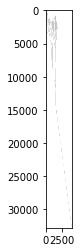

In [ ]:
from sklearn import tree
import pydotplus
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import matplotlib.image as pltimg
from sklearn.model_selection import train_test_split
from sklearn import metrics

features = ['Time','Open','Low','Volume']

x = df4[features]
y = df4['High']

xtrain,xtest,ytrain,ytest, = train_test_split(x,y,test_size=0.99,random_state=210)

dtree = DecisionTreeClassifier()
dtree = dtree.fit(xtrain,ytrain)

ypred = dtree.predict(xtest)
print("Accuracy: ",metrics.accuracy_score(ytest, ypred))

data = tree.export_graphviz(dtree, out_file=None, feature_names=features)
graph = pydotplus.graph_from_dot_data(data)
graph.write_png('decisiontree_matresult.png')

img = pltimg.imread('decisiontree_matresult.png')
imgplot = plt.imshow(img)
plt.show()